ПРЕДСКАЗАНИЕ ТЕМПЕРАТУРЫ СТАЛИ НА МЕТАЛЛУРГИЧЕСКОМ КОМБИНАТЕ

**Описание проекта**

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

**Цель исследования**

Создать модель, предсказывающую температуру стали с точностью mae < 8.7.

**ПЛАН**

 1. Обзор данных
 - Загрузка данных, выведение общей информации о датасете
 - Исследование пропусков и явных дубликатов.
 - Исследование значений каждого столбца на предмет аномальных данных
 2. Предобработка данных
 - удаление ошибок и заполнение пропусков
 - подготовить единый датасет
 - исследовать корреляцию
 - масштабирование признаков для линейной регресии 
 - деление выборки на треин и тест
 - в трейн выборки удаление аномальных значений
 - создание признаков: по партиям найти суммарное время нагрева дугой, найти средние значения реактивной и активной мощности
 - исследовать коррляцию новых признаков
 3. Обучение моделей
 - обучение модели линейной регрессии с использованием кросс валидации
 - обучение еще одной или нескольких моделей
 4. Тестирование модели
 - финальное тестирование лучшей модели на тестовой выборке
 5. Общий вывод
 

## 1. Изучение данных

### 1.1 Загрузка данных

Импортируем нужные библиотеки:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import matplotlib.pyplot as plt
import shap
import phik
from phik.report import plot_correlation_matrix
from phik import report

from datetime import time

from sklearn import svm
from sklearn import neighbors
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor

from lightgbm import LGBMRegressor
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from catboost import CatBoostRegressor

In [2]:
path = 'C://Users//Татьяна//Desktop//Файлы Юпитер Ноутбук//Проекты_DS//data//final_steel//final_steel//'
path_yandex = 'https://code.s3.yandex.net//datasets//final_steel//'
data_arc = pd.read_csv(path + 'data_arc.csv', sep=',', encoding='utf-8')
data_bulk = pd.read_csv(path + 'data_bulk.csv', sep=',', encoding='utf-8')
data_bulk_time = pd.read_csv(path + 'data_bulk_time.csv', sep=',', encoding='utf-8') 
data_gas = pd.read_csv(path + 'data_gas.csv', sep=',', encoding='utf-8')
data_temp = pd.read_csv(path + 'data_temp.csv', sep=',', encoding='utf-8')
data_wire = pd.read_csv(path + 'data_wire.csv', sep=',', encoding='utf-8')
data_wire_time = pd.read_csv(path + 'data_wire_time.csv', sep=',', encoding='utf-8')

In [3]:
def file_reading(path):
    path_local = 'C://Users//Татьяна//Desktop//Файлы Юпитер Ноутбук//Проекты_DS//data//final_steel//final_steel//'
    path_yandex = 'https://code.s3.yandex.net//datasets//final_steel//'
    try:
        df = pd.read_csv( path_local + path , sep=',', encoding='utf-8')
        print('Прочитано с локального диска')
    except:
        df = pd.read_csv( path_yandex + path , sep=',')
    return df

In [4]:
# данные об электродах
data_arc = file_reading('data_arc.csv')
# Приведём названия столбцов в соответствие с хорошим стилем.
data_arc.columns = [re.sub(r' ', '_', name).lower() for name in data_arc.columns]
display(data_arc.head())
data_arc.info()

Прочитано с локального диска


,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   начало_нагрева_дугой  14876 non-null  object 
 2   конец_нагрева_дугой   14876 non-null  object 
 3   активная_мощность     14876 non-null  float64
 4   реактивная_мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


In [5]:
# данные о подаче сыпучих материалов (объём)
data_bulk = file_reading('data_bulk.csv')
data_bulk.columns = [re.sub(r' ', '_', name).lower() for name in data_bulk.columns]
display(data_bulk.head())
data_bulk.info()

Прочитано с локального диска


,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   bulk_1   252 non-null    float64
 2   bulk_2   22 non-null     float64
 3   bulk_3   1298 non-null   float64
 4   bulk_4   1014 non-null   float64
 5   bulk_5   77 non-null     float64
 6   bulk_6   576 non-null    float64
 7   bulk_7   25 non-null     float64
 8   bulk_8   1 non-null      float64
 9   bulk_9   19 non-null     float64
 10  bulk_10  176 non-null    float64
 11  bulk_11  177 non-null    float64
 12  bulk_12  2450 non-null   float64
 13  bulk_13  18 non-null     float64
 14  bulk_14  2806 non-null   float64
 15  bulk_15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [6]:
# данные о подаче сыпучих материалов (время)
data_bulk_time = file_reading('data_bulk_time.csv')
data_bulk_time.columns = [re.sub(r' ', '_', name).lower() for name in data_bulk_time.columns]
display(data_bulk_time.head())
data_bulk_time.info()

Прочитано с локального диска


,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   bulk_1   252 non-null    object
 2   bulk_2   22 non-null     object
 3   bulk_3   1298 non-null   object
 4   bulk_4   1014 non-null   object
 5   bulk_5   77 non-null     object
 6   bulk_6   576 non-null    object
 7   bulk_7   25 non-null     object
 8   bulk_8   1 non-null      object
 9   bulk_9   19 non-null     object
 10  bulk_10  176 non-null    object
 11  bulk_11  177 non-null    object
 12  bulk_12  2450 non-null   object
 13  bulk_13  18 non-null     object
 14  bulk_14  2806 non-null   object
 15  bulk_15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


In [7]:
# данные о продувке сплава газом
data_gas = file_reading('data_gas.csv')
data_gas.columns = [re.sub(r' ', '_', name).lower() for name in data_gas.columns]
display(data_gas.head())
data_gas.info()

Прочитано с локального диска


,key,газ_1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   газ_1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [8]:
# результаты измерения температуры
data_temp = file_reading('data_temp.csv')
data_temp.columns = [re.sub(r' ', '_', name).lower() for name in data_temp.columns]
display(data_temp.head())
data_temp.info()

Прочитано с локального диска


,key,время_замера,температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   время_замера  15907 non-null  object 
 2   температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


In [9]:
# данные о проволочных материалах (объём)
data_wire = file_reading('data_wire.csv')
data_wire.columns = [re.sub(r' ', '_', name).lower() for name in data_wire.columns]
display(data_wire.head())
data_wire.info()

Прочитано с локального диска


,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   wire_1  3055 non-null   float64
 2   wire_2  1079 non-null   float64
 3   wire_3  63 non-null     float64
 4   wire_4  14 non-null     float64
 5   wire_5  1 non-null      float64
 6   wire_6  73 non-null     float64
 7   wire_7  11 non-null     float64
 8   wire_8  19 non-null     float64
 9   wire_9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [10]:
# данные о проволочных материалах (время)
data_wire_time = file_reading('data_wire_time.csv')
data_wire_time.columns = [re.sub(r' ', '_', name).lower() for name in data_wire_time.columns]
display(data_wire_time.head())
data_wire_time.info()

Прочитано с локального диска


,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   wire_1  3055 non-null   object
 2   wire_2  1079 non-null   object
 3   wire_3  63 non-null     object
 4   wire_4  14 non-null     object
 5   wire_5  1 non-null      object
 6   wire_6  73 non-null     object
 7   wire_7  11 non-null     object
 8   wire_8  19 non-null     object
 9   wire_9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


Во всех файлах столбец key содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки.

### 1.2 Исследование пропусков

Выведем столбцы с пропусками с указанием количества и процента пропусков.

In [11]:
dfs = [data_arc, data_bulk, data_bulk_time, data_gas, data_temp, data_wire, data_wire_time]

In [12]:
# Создадим таблицу с данными о пропусках, добавим расчет процента пропусков от всех данных по столбцам.
for df in dfs:
    omissions = df.isna().sum()
    omissions = omissions.to_frame().reset_index() # сконвертим series в датафрейм
    omissions = omissions.rename(columns= {0: 'value'})
    omissions.index.name = 'index'
    omissions['persantage'] = (omissions['value']/len(df)*100).round(1) #выведем процент пропусков 
    display(omissions[omissions['persantage']!=0])

,index,value,persantage
index,,,


,index,value,persantage
index,,,
1,bulk_1,2877,91.9
2,bulk_2,3107,99.3
3,bulk_3,1831,58.5
4,bulk_4,2115,67.6
5,bulk_5,3052,97.5
6,bulk_6,2553,81.6
7,bulk_7,3104,99.2
8,bulk_8,3128,100.0
9,bulk_9,3110,99.4


,index,value,persantage
index,,,
1,bulk_1,2877,91.9
2,bulk_2,3107,99.3
3,bulk_3,1831,58.5
4,bulk_4,2115,67.6
5,bulk_5,3052,97.5
6,bulk_6,2553,81.6
7,bulk_7,3104,99.2
8,bulk_8,3128,100.0
9,bulk_9,3110,99.4


,index,value,persantage
index,,,


,index,value,persantage
index,,,
2,температура,2901,18.2


,index,value,persantage
index,,,
1,wire_1,26,0.8
2,wire_2,2002,65.0
3,wire_3,3018,98.0
4,wire_4,3067,99.5
5,wire_5,3080,100.0
6,wire_6,3008,97.6
7,wire_7,3070,99.6
8,wire_8,3062,99.4
9,wire_9,3052,99.1


,index,value,persantage
index,,,
1,wire_1,26,0.8
2,wire_2,2002,65.0
3,wire_3,3018,98.0
4,wire_4,3067,99.5
5,wire_5,3080,100.0
6,wire_6,3008,97.6
7,wire_7,3070,99.6
8,wire_8,3062,99.4
9,wire_9,3052,99.1


Удалим сразу стольбцы со 100% или около пропусками. Это столбцы 'Bulk 8' в датасетах data_bulk, data_bulk_time, 'wire_5',  
'wire_7' в датасетах data_wire, data_wire_time.

In [13]:
# data_bulk.columns
data_bulk = data_bulk[['key', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12',
       'bulk_13', 'bulk_14', 'bulk_15']]

In [14]:
data_bulk_time = data_bulk_time[['key', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12',
       'bulk_13', 'bulk_14', 'bulk_15']]

In [15]:
# data_wire.columns
data_wire = data_wire[['key', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6',
        'wire_8', 'wire_9']]

In [16]:
# data_wire_time.columns
data_wire_time = data_wire_time[['key', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6',
        'wire_8', 'wire_9']]

In [17]:
# Проверим на дубликаты
for df in dfs:
    print(df.duplicated().sum())

0
0
0
0
0
0
0


Дубликаты не обнаружены.

### 1.3 Изучение распределения данных

#### 1.3.1 Датасет data_arc (данные об электродах)

Посмотрим, сколько уникальных партий в первом датасете.

In [18]:
len(data_arc['key'].unique())

3214

Изменим время на тип данных 

In [19]:
data_arc['начало_нагрева_дугой'] = pd.to_datetime(data_arc['начало_нагрева_дугой'])
data_arc['конец_нагрева_дугой'] = pd.to_datetime(data_arc['конец_нагрева_дугой'])

Выведем временной период наблюдений.

In [20]:
data_arc['начало_нагрева_дугой'].min(), data_arc['конец_нагрева_дугой'].max()

(Timestamp('2019-05-03 11:02:14'), Timestamp('2019-09-01 04:36:08'))

In [21]:
data_arc.describe()

,key,активная_мощность,реактивная_мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Имеются выбросы реактивной мощности.

In [22]:
data_arc[data_arc['реактивная_мощность']<=0]

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924


Такая строка всего одна, удалим её при предобработке.

In [23]:
# data_arc = data_arc[data_arc['реактивная_мощность']>0]

Построим диаграммы размаха для данных по мощностям.

<AxesSubplot:>

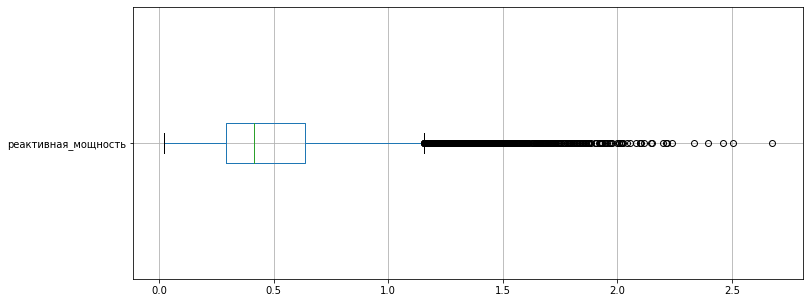

In [24]:
data_arc[data_arc['реактивная_мощность']>0].boxplot('реактивная_мощность',  figsize=(12,5), vert=False)

<AxesSubplot:>

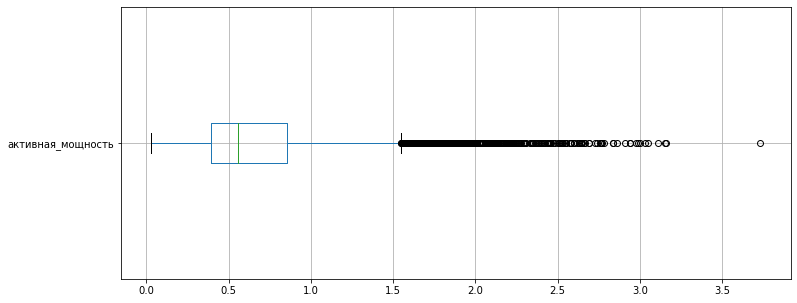

In [25]:
data_arc.boxplot('активная_мощность',  figsize=(12,5), vert=False)

Удалим позже также крайнее значение активной мощности, т.к. оно также похоже на выброс.

#### 1.3.2 Датасет data_bulk (данные о подаче сыпучих материалов (объём))

In [27]:
data_bulk.describe()

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Построем диаграмму размаха для компонента bulk_12. Максимальное значение значительно превышает третий квантиль.

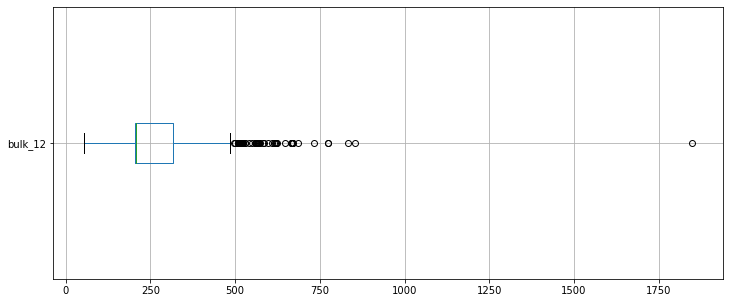

In [28]:
data_bulk.boxplot('bulk_12',  figsize=(12,5), vert=False)
plt.show()

Выброс, сделаем заметку на удаление.

In [29]:
# data_bulk = data_bulk[data_bulk['bulk_12']<1750]
data_bulk.shape

(3129, 15)

Построем диаграмму размаха для остальных видов сыпучих материалов.

In [30]:
data_bulk.columns

Index(['key', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13',
       'bulk_14', 'bulk_15'],
      dtype='object')

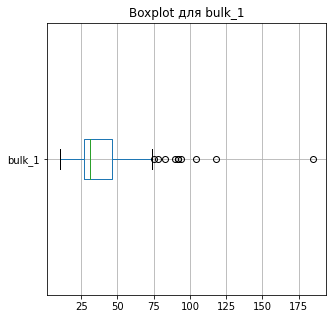

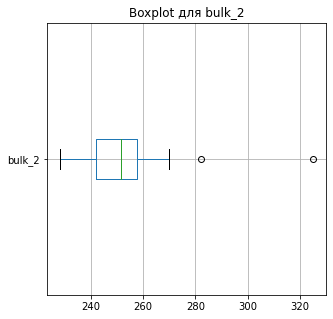

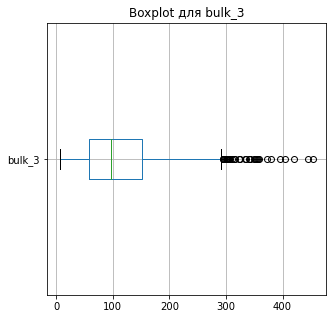

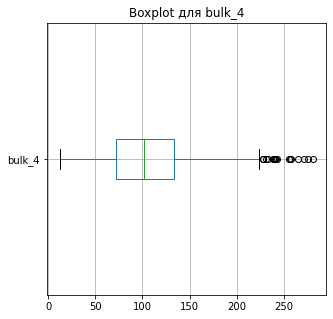

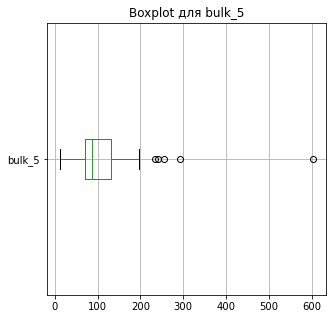

...

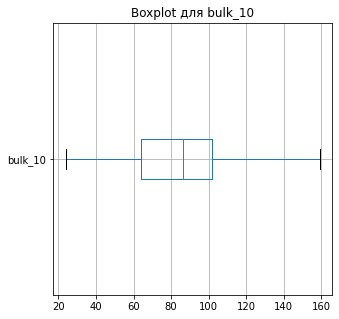

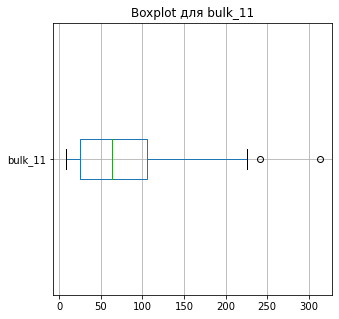

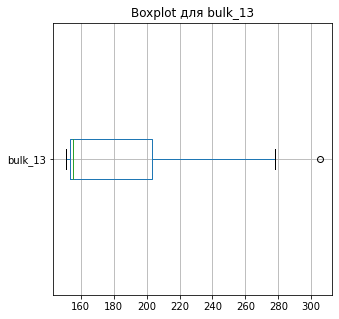

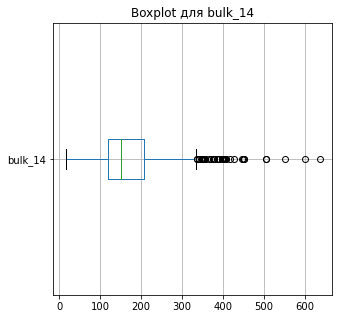

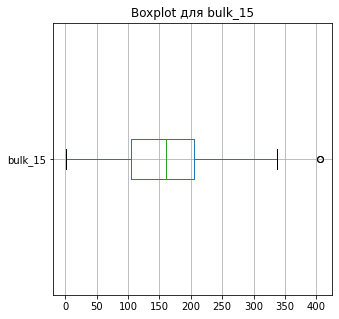

In [31]:
for i in ['bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_13',
       'bulk_14', 'bulk_15']:
    data_bulk[data_bulk[i] != 0].boxplot( i,  figsize=(5,5), vert=False)
    plt.title('Boxplot для '+ i)
    plt.show()

У распределения сыпучих материалов bulk_1, bulk_5, bulk_6, bulk_9, bulk_13 имаеется сильная ассиметрия данных, со смещением медианы влево; также на многоих графиках имеются значения, выходящие за рамки максимального значения, возможно, выбросы.

#### 1.3.3 Датасет data_gas (данные о продувке сплава газом)

In [32]:
data_gas.describe()

,key,газ_1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


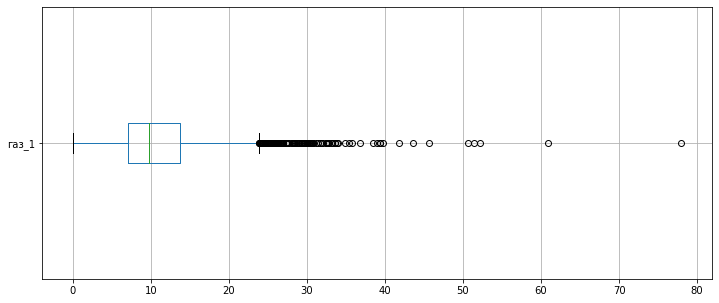

In [33]:
data_gas.boxplot('газ_1',  figsize=(12,5), vert=False)
plt.show()

In [34]:
data_gas[data_gas['газ_1']>50].count()

key      5
газ_1    5
dtype: int64

Удалим для обучающей выборки 5 значений вверху графика.

In [35]:
# data_gas = data_gas[data_gas['газ_1']<=50]
data_gas.shape

(3239, 2)

Посмотрим на распределение данных по-другому.

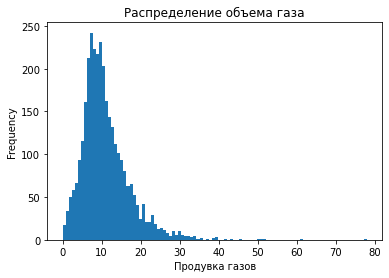

In [36]:
plt.xlabel('Продувка газов')
#plt.xlim(0, 40)
data_gas['газ_1'].plot(kind='hist', bins=100, title='Распределение объема газа')
plt.show()

Объемы газа для продувки распределены по типу лонгнормального распределения, с выраженным "хвостом" справа. Единичные наблюдения превышают медиану в 5 - 8 раз. Возможно, это выбросы.

#### 1.3.4 Датасет data_temp (результаты измерения температуры)

В датасете data_temp хранится целевой признак.  Также имеется 18% пропусков. 

In [37]:
# изменим тип данных для вермени
data_temp['время_замера'] = pd.to_datetime(data_temp['время_замера'])

In [38]:
data_temp.describe()

,key,температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


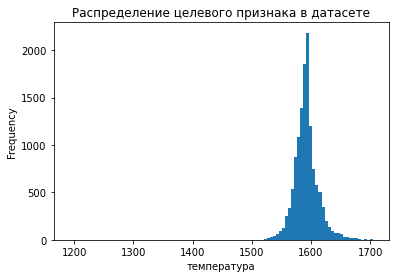

In [39]:
plt.xlabel('температура')
#plt.xlim(0,500)
data_temp['температура'].plot(kind='hist', bins=100, title='Распределение целевого признака в датасете')
plt.show()

Как мы видим, целевой признак имеет близкое к нормальному распределение.

#### 1.3.5 Датасет data_wire (данные о проволочных материалах (объём))

In [40]:
data_wire.describe()

,key,wire_1,wire_2,wire_3,wire_4,wire_6,wire_8,wire_9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,73.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442842,48.016974,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,33.919845,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,0.034320,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,25.053600,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,42.076324,46.279999,30.066399
75%,2434.000000,126.060483,70.227558,276.252014,76.124619,64.212723,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,180.454575,102.762401,90.053604


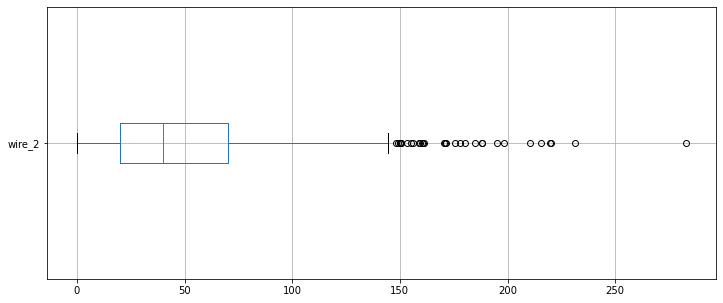

In [41]:
data_wire[data_wire['wire_2'] != 0].boxplot('wire_2',  figsize=(12,5), vert=False)
plt.show()

Будем считать объем по wire_2 более 250 выбросом.

In [42]:
# data_wire = data_wire[data_wire['wire_2']<250]

Исследуем распределение остальных видов проволочных материалов.

In [43]:
data_wire.columns

Index(['key', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6', 'wire_8',
       'wire_9'],
      dtype='object')

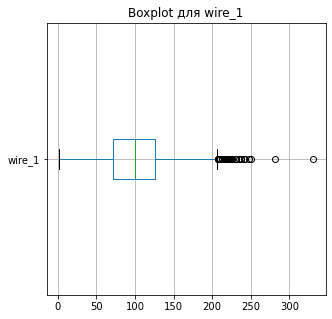

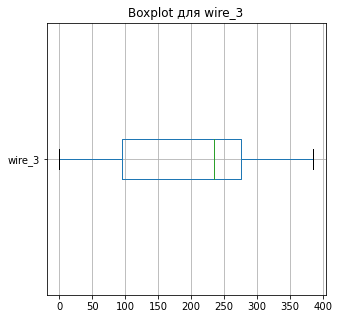

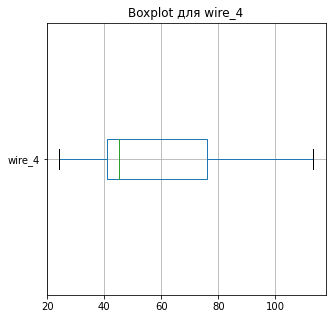

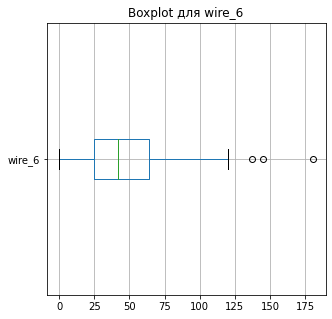

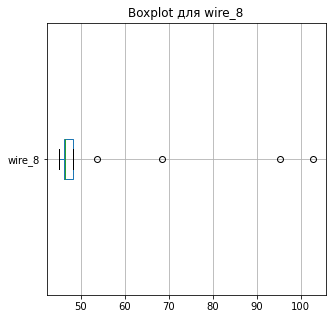

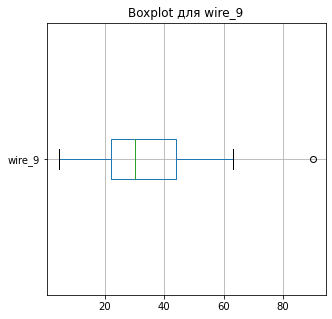

In [44]:
for i in ['wire_1', 'wire_3', 'wire_4', 'wire_6', 'wire_8',
       'wire_9']:
    data_wire[data_wire[i] != 0].boxplot( i,  figsize=(5,5), vert=False)
    plt.title('Boxplot для ' + i)
    plt.show()

Многие значения объемов проволочных материалов выглядят выбросами, однако нужно учитывать малое количество добавлений проволочных материалов начиная с wire_3. 

### Вывод

При изучении данных были сделаны следующие наблюдения: 
- целевой признак - температура - распределён нормально
- многие данные о количество сыпучих материалов, а также некоторые показатели объема проволок и газа имеют чрезмерно высокие значения. 
- возможно целесообразным будет создать дополнителый признак с общим количество сыпучих материалов в каждой парии
- не хватает общего времени нагрева - необходимо создать дополнительный признак из имеющихся данных.  


## 2. Предобработка данных.

### 2.1 Удаление ошибок и заполнение пропусков

Удалим из общего датасета  сильно отрицательную реактивную мощность и термпературы меньше 1500 градусов

In [45]:
# найдем ключ с отрицательной мощностью
data_arc[data_arc['реактивная_мощность']<0]

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924


In [46]:
# data_arc = data_arc[data_arc['реактивная_мощность']>0]

In [47]:
data_arc = data_arc[data_arc['key']!=2116]

Посмотрим, сколько выходящих за рамки условия температур, также увидим, к каким ключам они принадлежат.

In [48]:
data_temp[data_temp['температура']<1500]

,key,время_замера,температура
4350,867,2019-06-04 14:21:00,1191.0
5978,1214,2019-06-16 05:32:00,1208.0
7958,1619,2019-06-30 11:03:54,1218.0
8913,1818,2019-07-07 00:30:49,1383.0
8914,1818,2019-07-07 00:31:40,1383.0
10127,2052,2019-07-21 14:51:40,1227.0
12564,2561,2019-08-08 07:34:15,1204.0


7 наблюдений. Удаляем.

In [49]:
data_temp.shape

(15907, 3)

In [50]:
#data_temp = data_temp[data_temp['температура']>=1500]

In [51]:
for i in [867,1214,1619,1818,2052,2561]:
    data_temp = data_temp[data_temp['key'] != i]
data_temp.shape    

(15857, 3)

Удалено 40 строк.

В датасете data_bulk много пропусков, означающих, что данные компоненты не подавались во время партии. Заполним из нулями.

In [52]:
data_bulk = data_bulk.fillna(0)

В датасете data_wire заполним пропуски нулями.

In [53]:
data_wire = data_wire.fillna(0)

In [54]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15857 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           15857 non-null  int64         
 1   время_замера  15857 non-null  datetime64[ns]
 2   температура   12961 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 495.5 KB


### 2.2 Подготовка датасета data_arc для объединения.

Вычислим время нагревания каждого цикла.

In [55]:
data_arc.loc[:, 'heat_time'] = data_arc['конец_нагрева_дугой'] - data_arc['начало_нагрева_дугой']
data_arc.head()

C:\Your_user\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,heat_time
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28


Преобразуем время нагрева в секунды

In [56]:
data_arc['heat_time'] = data_arc['heat_time'] / np.timedelta64(1, 's')

C:\Users\8C74~1\AppData\Local\Temp/ipykernel_11104/3743023044.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_arc['heat_time'] = data_arc['heat_time'] / np.timedelta64(1, 's')


Приведём полученное время в тип int, чтобы обработать агрегирующей функцией.

In [57]:
data_arc['heat_time'] = data_arc['heat_time'].astype(int)

C:\Users\8C74~1\AppData\Local\Temp/ipykernel_11104/2402256126.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_arc['heat_time'] = data_arc['heat_time'].astype(int)


Выделим доп признаки: среднее соотношение потребления активной и реактивной мощности и полную мощность.

In [58]:
data_arc['power_ratio'] = data_arc['активная_мощность'] / data_arc['реактивная_мощность']

C:\Users\8C74~1\AppData\Local\Temp/ipykernel_11104/3735236331.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_arc['power_ratio'] = data_arc['активная_мощность'] / data_arc['реактивная_мощность']


In [59]:
data_arc['full_power'] = ( (data_arc['активная_мощность'])**2 + (data_arc['реактивная_мощность'])**2 )**0.5

C:\Users\8C74~1\AppData\Local\Temp/ipykernel_11104/1094217933.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_arc['full_power'] = ( (data_arc['активная_мощность'])**2 + (data_arc['реактивная_мощность'])**2 )**0.5


In [60]:
data_arc.head(10)

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,heat_time,power_ratio,full_power
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,228,1.420582,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,185,1.548395,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,172,1.492292,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,365,1.561504,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,148,1.671717,0.807239
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043,137,1.547690,0.521549
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914,338,1.451893,1.574162
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281,126,1.606312,0.577638
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874,210,1.601441,0.975867
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494,280,1.581626,1.256527


Агрегируем:

In [61]:
data_arc_grouped = data_arc.groupby('key').agg(
                                                активная_мощность=('активная_мощность', np.mean),
                                                реактивная_мощность=('реактивная_мощность', np.mean),
                                                heat_time=('heat_time',np.sum),
                                                heat_count=('heat_time', 'count'),
                                                power_ratio=('power_ratio', np.mean),
                                                full_power=('full_power',np.mean)
)

In [62]:
data_arc_grouped = data_arc_grouped.reset_index() # выделим партию в столбец
data_arc_grouped.head()

,key,активная_мощность,реактивная_мощность,heat_time,heat_count,power_ratio,full_power
0,1,0.975629,0.636648,1098,5,1.538898,1.165279
1,2,0.763150,0.499528,811,4,1.551834,0.912304
2,3,0.505176,0.319815,655,5,1.583120,0.597907
3,4,0.802313,0.515074,741,4,1.563487,0.953741
4,5,0.836793,0.563161,869,4,1.480428,1.008939


In [63]:
data_arc_grouped.shape

(3213, 7)

Получили датафрейм с новыми признаками.

### 2.3 Подготовка датасета data_temp для объединения.

Чтобы не поставить вместо целевого признака промежуточную температуру, удалим ключи, где нет последней температуры.

In [64]:
len(data_temp[data_temp['температура'].isna()==True]['key'].unique())

738

Таких ключей 738. Использовать них нельзя, т.к. по сути в данных нет целевого признака. Удаляем.

In [65]:
wrong_keys = list(data_temp[data_temp['температура'].isna()==True]['key'].unique())
for i in wrong_keys:
    data_temp = data_temp[data_temp['key']!=i]
data_temp = data_temp.reset_index(drop=True)

In [66]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12223 entries, 0 to 12222
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12223 non-null  int64         
 1   время_замера  12223 non-null  datetime64[ns]
 2   температура   12223 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 286.6 KB


In [67]:
data_temp.head(12)

,key,время_замера,температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


Выделим целевой признак - последнее значение замера температуры и возьмём первый замер в качестве дополнительного признака.

In [68]:
data_temp_grouped = data_temp.groupby('key').agg(
                                                temp_first=('температура', 'first'),
                                                температура=('температура', 'last'),
                                                temp_count=('температура','count' )
)
data_temp_grouped = data_temp_grouped.reset_index()
data_temp_grouped.head()

,key,temp_first,температура,temp_count
0,1,1571.0,1613.0,5
1,2,1581.0,1602.0,6
2,3,1596.0,1599.0,5
3,4,1601.0,1625.0,3
4,5,1576.0,1602.0,2


In [69]:
data_temp_grouped.shape

(2472, 4)

Удалим также ключи партий, где был только один замер температуры.

In [70]:
data_temp_grouped = data_temp_grouped[data_temp_grouped['temp_count']!=1]
data_temp_grouped.shape

(2470, 4)

In [71]:
# теперь столбец с количеством замеров можно удалить


In [72]:
data_temp_grouped = data_temp_grouped.drop('temp_count', axis=1) # удалим лишний столбец

In [73]:
data_temp_grouped.head()

,key,temp_first,температура
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0


Получили датафрейм с попартийными данными о первой и последней измеренной температуре.

### 2.4 Объединение датасетов

Объединим 5 таблиц в один датасет. 

In [75]:
df = data_temp_grouped.merge(data_arc_grouped, on='key', how='inner')
df.head()

,key,temp_first,температура,активная_мощность,реактивная_мощность,heat_time,heat_count,power_ratio,full_power
0,1,1571.0,1613.0,0.975629,0.636648,1098,5,1.538898,1.165279
1,2,1581.0,1602.0,0.763150,0.499528,811,4,1.551834,0.912304
2,3,1596.0,1599.0,0.505176,0.319815,655,5,1.583120,0.597907
3,4,1601.0,1625.0,0.802313,0.515074,741,4,1.563487,0.953741
4,5,1576.0,1602.0,0.836793,0.563161,869,4,1.480428,1.008939


In [76]:
df = df.merge(data_bulk, on='key', how='inner')
df = df.merge(data_gas, on='key', how='inner')
df = df.merge(data_wire, on='key', how='inner')

Создадим еще 2 признака - суммарные объемы сыпучих и проволочных материалов.

In [78]:
df['total_bulk'] = (df['bulk_1'] + df['bulk_2'] + df['bulk_3'] + df['bulk_4'] + df['bulk_5'] + df['bulk_6'] + df['bulk_7'] + 
                    df['bulk_9'] + df['bulk_10'] + df['bulk_11'] + df['bulk_12'] + df['bulk_13'] + df['bulk_14'] + df['bulk_15'])
df['total_wire'] = (df['wire_1'] + df['wire_2'] + df['wire_3'] + df['wire_4'] + df['wire_6'] + df['wire_8'] + df['wire_9'] )

In [79]:
print(df.shape)
df.head()

(2324, 33)


,key,temp_first,температура,активная_мощность,реактивная_мощность,heat_time,heat_count,power_ratio,full_power,bulk_1,...,газ_1,wire_1,wire_2,wire_3,wire_4,wire_6,wire_8,wire_9,total_bulk,total_wire
0,1,1571.0,1613.0,0.975629,0.636648,1098,5,1.538898,1.165279,0.0,...,29.749986,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,553.0,60.059998
1,2,1581.0,1602.0,0.763150,0.499528,811,4,1.551834,0.912304,0.0,...,12.555561,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,582.0,96.052315
2,3,1596.0,1599.0,0.505176,0.319815,655,5,1.583120,0.597907,0.0,...,28.554793,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,544.0,91.160157
3,4,1601.0,1625.0,0.802313,0.515074,741,4,1.563487,0.953741,0.0,...,18.841219,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,595.0,89.063515
4,5,1576.0,1602.0,0.836793,0.563161,869,4,1.480428,1.008939,0.0,...,5.413692,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,584.0,98.352796


Получили единый датасет с целевым признаком, номером партии и еще 31 признаками.

### 2.5 Исследование корреляции данных с целевым признаком

In [80]:
features = df.drop(['key'], axis=1)
correlation = features.corr()['температура']
correlation = abs(correlation)
correlation = correlation.sort_values(ascending=False)
correlation

температура            1.000000
wire_1                 0.317488
temp_first             0.301882
heat_time              0.277953
bulk_12                0.266805
bulk_15                0.265772
total_bulk             0.222145
активная_мощность      0.210586
wire_2                 0.207242
full_power             0.190470
bulk_4                 0.187817
bulk_6                 0.180906
heat_count             0.180276
wire_4                 0.159839
power_ratio            0.159601
реактивная_мощность    0.149261
bulk_11                0.114936
bulk_14                0.114893
bulk_7                 0.107371
wire_6                 0.084149
bulk_2                 0.082543
bulk_1                 0.075428
bulk_10                0.061227
total_wire             0.060955
газ_1                  0.059079
wire_3                 0.047636
bulk_3                 0.037156
bulk_5                 0.028446
wire_9                 0.027561
bulk_9                 0.016130
bulk_13                0.010974
wire_8  

Как видно, мы имеем множество слабо коррелируюх признаков. 

Дополнительно исследуем признаки на мультиколлениарность. Построем матрицу корреляции, испльзуя библиотеку phik.

interval columns not set, guessing: ['key', 'temp_first', 'температура', 'активная_мощность', 'реактивная_мощность', 'heat_time', 'heat_count', 'power_ratio', 'full_power', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 'bulk_7', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13', 'bulk_14', 'bulk_15', 'газ_1', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6', 'wire_8', 'wire_9', 'total_bulk', 'total_wire']


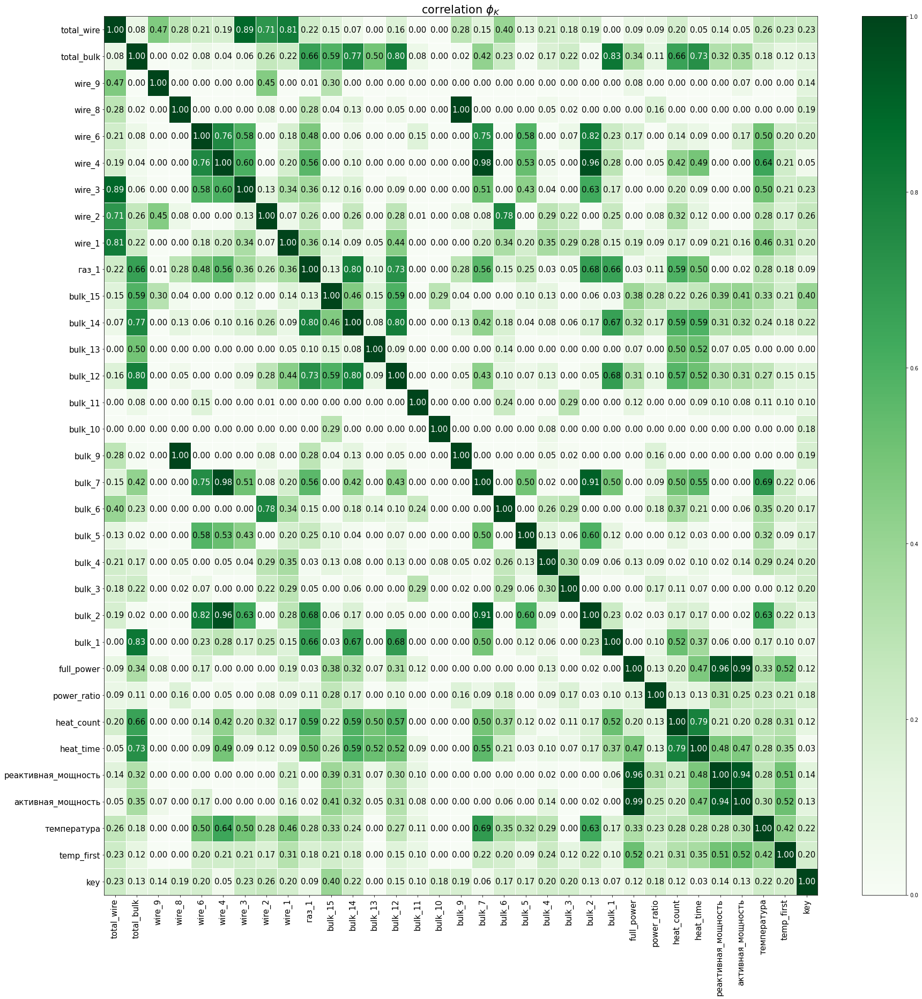

In [81]:
phik_overview = df.phik_matrix()
phik_overview.round(2)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=1.5, 
                        figsize=(26, 26))
plt.tight_layout()

Обратим внимание, что матрица phik показывает другие коэффициента корреляции, чем Пирсон. Дело в том, что phik учитывает и нелинейные зависимости.

In [82]:
correlation

температура            1.000000
wire_1                 0.317488
temp_first             0.301882
heat_time              0.277953
bulk_12                0.266805
bulk_15                0.265772
total_bulk             0.222145
активная_мощность      0.210586
wire_2                 0.207242
full_power             0.190470
bulk_4                 0.187817
bulk_6                 0.180906
heat_count             0.180276
wire_4                 0.159839
power_ratio            0.159601
реактивная_мощность    0.149261
bulk_11                0.114936
bulk_14                0.114893
bulk_7                 0.107371
wire_6                 0.084149
bulk_2                 0.082543
bulk_1                 0.075428
bulk_10                0.061227
total_wire             0.060955
газ_1                  0.059079
wire_3                 0.047636
bulk_3                 0.037156
bulk_5                 0.028446
wire_9                 0.027561
bulk_9                 0.016130
bulk_13                0.010974
wire_8  

Проанализируем признаки, имеющие корреляюцию с целевым по коэффициенту Пирсона не менее 5. Согласно построенной матрице проверим, не коррелируют ли взятые признаки друг с другом более чем с коэффициентом в 0.7. 

Получены следующие наблюдения:  
Признак full_power коррелирует с реактивной и активной мощностями. Оставим в признаках только full_power.  
wire_1 коррелирует с total_wire  
wire_4 коррелирует с bulk_2 
wire_6 коррелирует с bulk_2  
heat_time коррелирует с heat_count и total_bulk  
газ_1 коррелирует с bulk_14, bulk_12, которые сильно коррелируют между собой  
bulk_7 коррелирует с bulk_2  
heat_count коррелирует heat_time
Считается, что качеству модели вредит использование сильно коррелирующих признаков. Отберём самые сильные из взаимокоррелирующих.

Итого, мы получили следующие признаки для температуры без мультиколлинеарности:

In [83]:
features_list = ['wire_4', 'full_power', 'wire_1', 'wire_3', 'wire_6', 'wire_2', 'газ_1', 'bulk_15', 'bulk_7', 'bulk_1',
                 'power_ratio', 'heat_time', 'temp_first']

In [84]:
len(features_list)

13

### 2.6 Выделение признаков

In [85]:
STATE = 101022
df_train, df_test = train_test_split(df, test_size=0.25, random_state=STATE)
print(df_train.shape, df_test.shape)

(1743, 33) (581, 33)


Удалим некоторые выбросы из тренировочной выборки, замеченные на этапе изучения данных.

In [86]:
df_train.head()

,key,temp_first,температура,активная_мощность,реактивная_мощность,heat_time,heat_count,power_ratio,full_power,bulk_1,...,газ_1,wire_1,wire_2,wire_3,wire_4,wire_6,wire_8,wire_9,total_bulk,total_wire
1733,1858,1601.0,1591.0,0.721400,0.556639,355,2,1.341399,0.911309,0.0,...,8.775048,107.265602,30.009201,0.0,0.0,0.0,0.0,0.0,581.0,137.274803
749,815,1584.0,1589.0,0.585685,0.391125,1080,7,1.465419,0.704342,0.0,...,14.379395,16.099199,0.000000,0.0,0.0,0.0,0.0,0.0,578.0,16.099199
1347,1447,1634.0,1595.0,0.372576,0.251382,578,6,1.481217,0.449556,0.0,...,15.070838,173.066396,0.000000,0.0,0.0,0.0,0.0,0.0,624.0,173.066396
799,868,1577.0,1599.0,0.711556,0.568380,765,4,1.255397,0.911032,0.0,...,6.461385,103.849197,0.000000,0.0,0.0,0.0,0.0,0.0,503.0,103.849197
34,35,1585.0,1600.0,1.013479,0.626054,690,3,1.619579,1.191330,0.0,...,10.711469,130.079041,0.000000,0.0,0.0,0.0,0.0,0.0,802.0,130.079041


In [87]:
df_train[df_train['wire_2']>2200]

,key,temp_first,температура,активная_мощность,реактивная_мощность,heat_time,heat_count,power_ratio,full_power,bulk_1,...,газ_1,wire_1,wire_2,wire_3,wire_4,wire_6,wire_8,wire_9,total_bulk,total_wire


In [88]:
df_train = df_train[df_train['bulk_12']<1750]
df_train = df_train[df_train['bulk_3']<420]
df_train = df_train[df_train['bulk_4']<280]
df_train = df_train[df_train['bulk_6']<400]
df_train = df_train[df_train['bulk_11']<235]
df_train = df_train[df_train['bulk_15']<350]
df_train = df_train[df_train['wire_1']<260]
df_train.shape

(1732, 33)

Выделим признаки.

In [118]:
features_list

['wire_4',
 'full_power',
 'wire_1',
 'wire_3',
 'wire_6',
 'wire_2',
 'газ_1',
 'bulk_15',
 'bulk_7',
 'bulk_1',
 'power_ratio',
 'heat_time',
 'temp_first']

In [ ]:
'''признаки до исследования на мультиколлинеарность
Index(['temp_first', 'активная_мощность', 'реактивная_мощность', 'heat_time',
       'heat_count', 'power_ratio', 'full_power', 'bulk_1', 'bulk_2', 'bulk_4',
       'bulk_6', 'bulk_7', 'bulk_11', 'bulk_12', 'bulk_14', 'bulk_15',
       'wire_1', 'wire_2', 'wire_4', 'wire_6', 'wire_8', 'full_power_key',
       'total_bulk'],
      dtype='object')'''

In [126]:
'''новые признаки
features_list = ['wire_4', 'full_power', 'wire_1', 'wire_3', 'wire_6', 'wire_2', 'газ_1', 'bulk_15', 'bulk_7', 'bulk_1',
                 'power_ratio', 'heat_time', 'temp_first']'''

"новые признаки\nfeatures_list = ['wire_4', 'full_power', 'wire_1', 'wire_3', 'wire_6', 'wire_2', 'газ_1', 'bulk_15', 'bulk_7', 'bulk_1',\n                 'power_ratio', 'heat_time', 'temp_first']"

In [90]:
features_train = df_train.drop(['key', 'температура', 'активная_мощность', 'реактивная_мощность', 'heat_count', 
                                'total_wire', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 
                                'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13', 'bulk_14',
                                'wire_8', 'wire_9', 'total_bulk', 'total_wire' ], axis=1)
features_test = df_test.drop(['key', 'температура', 'активная_мощность', 'реактивная_мощность', 'heat_count', 
                                'total_wire', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 
                                'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13', 'bulk_14',
                                'wire_8', 'wire_9', 'total_bulk', 'total_wire' ], axis=1)
target_train = df_train['температура']
target_test = df_test['температура']

### 2.7 Масштабирование признаков

In [91]:
numeric = features_list
scaler = StandardScaler() # Создадим объект структуры
scaler.fit(features_train[numeric])

features_train[numeric] = scaler.transform(features_train[numeric])
features_test[numeric] = scaler.transform(features_test[numeric])
pd.options.mode.chained_assignment = None
print(features_train.head())

      temp_first  heat_time  power_ratio  full_power    bulk_1    bulk_7  \
1733    0.591851  -1.318298    -0.146141    0.289212 -0.282853 -0.058269   
749    -0.133647   0.788736     0.780291   -0.552445 -0.282853 -0.058269   
1347    2.000171  -0.670204     0.898295   -1.588564 -0.282853 -0.058269   
799    -0.432381  -0.126734    -0.788579    0.288086 -0.282853 -0.058269   
34     -0.090971  -0.344703     1.931861    1.427955 -0.282853 -0.058269   

       bulk_15     газ_1    wire_1    wire_2   wire_3    wire_4    wire_6  
1733  1.000457 -0.408606  0.118220  0.411519 -0.11536 -0.059001 -0.113937  
749  -1.429527  0.493278 -1.981530 -0.515203 -0.11536 -0.059001 -0.113937  
1347  0.976750  0.604549  1.633747 -0.515203 -0.11536 -0.059001 -0.113937  
799  -0.196754 -0.780934  0.039533 -0.515203 -0.11536 -0.059001 -0.113937  
34    0.419632 -0.096986  0.643660 -0.515203 -0.11536 -0.059001 -0.113937  


**Вывод**  
На этапе предобработки было выполнено:  
 - удаление ошибок и заполнение пропусков
 - создание признаков
 - подготовлен единый датасет
 - исследована корреляцию
 - деление выборки на треин и тест
 - масштабированы признаков для линейной регресии 


## 3 Обучение моделей

Обучим несколько моделей. Т.к. датасет имеет всего около 2.3 тыс строк, будем обучать с использованием кросс-валидации.

### 3.1 Линейная регрессия

In [92]:
model_regression = LinearRegression()

# применим метод кросс-валидации
scores = cross_val_score(model_regression, features_train, target_train, cv=5, scoring='neg_mean_absolute_error')

print('MАE модели линейной регрессии:', scores.mean())

MАE модели линейной регрессии: -6.175256776281375


### 3.2 Случайный лес

Подберём оптимальные параметры.

In [93]:
model_forest = RandomForestRegressor()
parametrs = { 'n_estimators': range (30, 91, 30),
              'max_depth': range (1,13, 2),
              #'min_samples_leaf': range (1,8),
              'min_samples_split': range (2,10,2) }

grid = GridSearchCV(model_forest, parametrs, cv=4, verbose=1, scoring='neg_mean_absolute_error')
grid.fit(features_train, target_train)

print(grid.best_score_)
grid.best_params_

Fitting 4 folds for each of 72 candidates, totalling 288 fits
-6.211305041618745


{'max_depth': 11, 'min_samples_split': 2, 'n_estimators': 60}

In [94]:
model_forest = RandomForestRegressor(random_state=STATE, max_depth=11, min_samples_leaf=3, n_estimators=90, 
                                      min_samples_split=2)
scores = cross_val_score(model_forest, features_train, target_train, cv=5, scoring='neg_mean_absolute_error')

print('MАE модели RandomForestRegressor:', scores.mean())

MАE модели RandomForestRegressor: -6.221694162281454


### 3.3 Градиентный бустинг

In [95]:
model_gbr = GradientBoostingRegressor()
parametrs = { 'n_estimators': range(40, 70, 20),   
              'max_depth': range(7,13, 2),
              'min_samples_leaf': range(1,11,4),
              'min_samples_split': range(2,12,3) }

grid = GridSearchCV(model_gbr, parametrs, cv=5, verbose=1, scoring='neg_mean_absolute_error')
grid.fit(features_train,target_train)

print(grid.best_score_)
grid.best_params_

Fitting 5 folds for each of 72 candidates, totalling 360 fits
-6.235944767959866


{'max_depth': 7,
 'min_samples_leaf': 5,
 'min_samples_split': 2,
 'n_estimators': 40}

In [116]:
model_gbr = GradientBoostingRegressor(random_state=STATE,
                                      n_estimators=40, max_depth=7, min_samples_leaf=5, min_samples_split=2)
scores = cross_val_score(model_gbr, features_train, target_train, cv=5, scoring='neg_mean_absolute_error')

print('MАE модели GradientBoostingRegressor:', scores.mean())

MАE модели GradientBoostingRegressor: -6.244029004733872


### 3.4 LGBMRegressor

In [97]:
model_lgbm = LGBMRegressor()
parametrs = { 'n_estimators': range(5, 110, 10),
              'num_leaves': range(21, 41, 5),
              'max_depth': range(-1,14, 2)}
grid = GridSearchCV(model_lgbm, parametrs, cv=4, verbose=1, scoring='neg_mean_absolute_error')
grid.fit(features_train,target_train)

print(grid.best_score_)
grid.best_params_

Fitting 4 folds for each of 352 candidates, totalling 1408 fits
-6.115517453695899


{'max_depth': 5, 'n_estimators': 55, 'num_leaves': 21}

In [112]:
model_lgbm = LGBMRegressor(random_state=STATE,
                           n_estimators=55, max_depth=5, num_leaves=21)
scores = cross_val_score(model_lgbm, features_train, target_train, cv=5, scoring='neg_mean_absolute_error')

print('MАE модели LGBMRegressor:', scores.mean())

MАE модели LGBMRegressor: -6.160229608938474


### 3.5 Nearest Neighbors regression

In [99]:
model_knn = neighbors.KNeighborsRegressor()
parametrs = { 'n_neighbors' : range(2, 6, 1),
               'weights' : ['uniform' , 'distance']
    
              }
grid = GridSearchCV(model_knn, parametrs, cv=4, verbose=1, scoring='neg_mean_absolute_error')
grid.fit(features_train,target_train)

print(grid.best_score_)
grid.best_params_

Fitting 4 folds for each of 8 candidates, totalling 32 fits
-6.654251483882374


{'n_neighbors': 5, 'weights': 'distance'}

### 3.6 CatBoostRegressor

In [100]:
model_cat = CatBoostRegressor()
parametrs = {'learning_rate': [0.03, 0.1],
             'depth': [4, 6, 10],
             'l2_leaf_reg': [1, 3, 5, 7, 9]}


grid = GridSearchCV(model_cat, parametrs, cv=4, verbose=1, scoring='neg_mean_absolute_error')
grid.fit(features_train,target_train)

print(grid.best_score_)
grid.best_params_

Fitting 4 folds for each of 30 candidates, totalling 120 fits
0:	learn: 10.5866576	total: 146ms	remaining: 2m 25s
1:	learn: 10.5260093	total: 148ms	remaining: 1m 13s
2:	learn: 10.4584936	total: 149ms	remaining: 49.6s
3:	learn: 10.3925760	total: 151ms	remaining: 37.5s
4:	learn: 10.3294081	total: 152ms	remaining: 30.2s
5:	learn: 10.2774929	total: 153ms	remaining: 25.3s
6:	learn: 10.2239814	total: 154ms	remaining: 21.8s
7:	learn: 10.1677367	total: 155ms	remaining: 19.2s
8:	learn: 10.1160616	total: 156ms	remaining: 17.1s
9:	learn: 10.0703734	total: 157ms	remaining: 15.5s
10:	learn: 10.0317775	total: 158ms	remaining: 14.2s
11:	learn: 9.9740958	total: 159ms	remaining: 13.1s
12:	learn: 9.9257329	total: 160ms	remaining: 12.2s
13:	learn: 9.8868720	total: 162ms	remaining: 11.4s
14:	learn: 9.8317305	total: 163ms	remaining: 10.7s
15:	learn: 9.7814314	total: 164ms	remaining: 10.1s
16:	learn: 9.7353283	total: 166ms	remaining: 9.6s
17:	learn: 9.6840692	total: 168ms	remaining: 9.15s
18:	learn: 9.63318

{'depth': 4, 'l2_leaf_reg': 9, 'learning_rate': 0.03}

In [107]:
model_cat = CatBoostRegressor(random_state=STATE, 
                              depth=4,
                              l2_leaf_reg=3,
                              learning_rate=0.03
                              #"loss_function": "RMSE"
                           )
scores = cross_val_score(model_cat, features_train, target_train, cv=4, scoring='neg_mean_absolute_error')# logging_level='Silent'

print('MАE модели CatBoostRegressor:', scores.mean())

0:	learn: 10.5965422	total: 1.49ms	remaining: 1.49s
1:	learn: 10.5184892	total: 2.87ms	remaining: 1.43s
2:	learn: 10.4569638	total: 4ms	remaining: 1.33s
3:	learn: 10.3898546	total: 5.23ms	remaining: 1.3s
4:	learn: 10.3433171	total: 6.52ms	remaining: 1.3s
5:	learn: 10.2815939	total: 7.63ms	remaining: 1.26s
6:	learn: 10.2220582	total: 8.8ms	remaining: 1.25s
7:	learn: 10.1581554	total: 9.93ms	remaining: 1.23s
8:	learn: 10.1004398	total: 11.1ms	remaining: 1.22s
9:	learn: 10.0524730	total: 12.2ms	remaining: 1.21s
10:	learn: 10.0064146	total: 13.3ms	remaining: 1.2s
11:	learn: 9.9499774	total: 14.3ms	remaining: 1.18s
12:	learn: 9.9033639	total: 15.4ms	remaining: 1.17s
13:	learn: 9.8568776	total: 16.4ms	remaining: 1.16s
14:	learn: 9.8110007	total: 17.6ms	remaining: 1.16s
15:	learn: 9.7633653	total: 19.2ms	remaining: 1.18s
16:	learn: 9.7133362	total: 20.4ms	remaining: 1.18s
17:	learn: 9.6717484	total: 21.6ms	remaining: 1.18s
18:	learn: 9.6461197	total: 22.7ms	remaining: 1.17s
19:	learn: 9.60786

Исследование влияния признаков после обучения модели.

auto_size_plot=False is deprecated and is now ignored! Use plot_size=None instead.


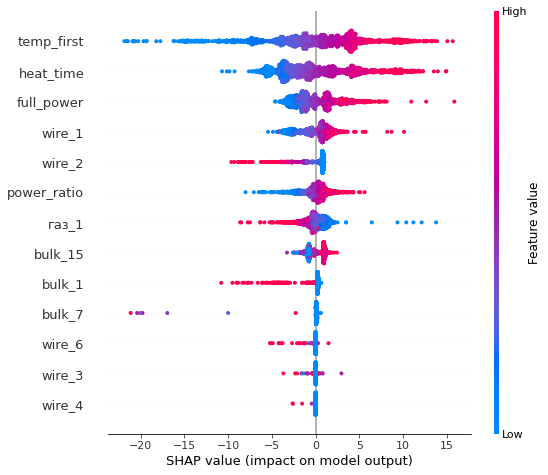

In [125]:
shap.initjs()
shap_test = shap.TreeExplainer(model_cat).shap_values(features_train)
shap.summary_plot(shap_test, features_train,
                      max_display=25, auto_size_plot=True)

Согласно графику, на предсказание модели сильно влияют первая темпаратура, врямя нагрева и показатель полной мощности.

**Вывод**  
В результате подготовки 6 моделей лучший результат показала модель CatBoostRegressor с метрикой mae 6.04. Возьмем ее для финальной проверки. 

## 4. Тестирование модели

In [108]:
model_cat.fit(features_train, target_train)

0:	learn: 10.8702572	total: 2.37ms	remaining: 2.37s
1:	learn: 10.7943113	total: 4.08ms	remaining: 2.04s
2:	learn: 10.7217811	total: 5.74ms	remaining: 1.91s
3:	learn: 10.6483824	total: 7.31ms	remaining: 1.82s
4:	learn: 10.5787464	total: 9.01ms	remaining: 1.79s
5:	learn: 10.5101395	total: 10.6ms	remaining: 1.76s
6:	learn: 10.4451949	total: 12.3ms	remaining: 1.74s
7:	learn: 10.3862891	total: 14.7ms	remaining: 1.82s
8:	learn: 10.3307213	total: 17.9ms	remaining: 1.97s
9:	learn: 10.2735910	total: 20.2ms	remaining: 2s
10:	learn: 10.2184513	total: 21.9ms	remaining: 1.97s
11:	learn: 10.1626063	total: 23.6ms	remaining: 1.94s
12:	learn: 10.1192640	total: 25.3ms	remaining: 1.92s
13:	learn: 10.0628001	total: 26.7ms	remaining: 1.88s
14:	learn: 10.0083290	total: 28.8ms	remaining: 1.89s
15:	learn: 9.9563742	total: 31.1ms	remaining: 1.91s
16:	learn: 9.9147012	total: 32.5ms	remaining: 1.88s
17:	learn: 9.8685096	total: 34.7ms	remaining: 1.89s
18:	learn: 9.8375721	total: 37.1ms	remaining: 1.91s
19:	learn:

In [109]:
predicted_test = model_cat.predict(features_test)
mae = mean_absolute_error(target_test ,predicted_test)
print('MАE модели CatBoostRegressor:', mae)

MАE модели CatBoostRegressor: 6.301136866973071


## План работы

 1. Обзор данных
 - Загрузка данных, выведение общей информации о датасете
 - Исследование пропусков и явных дубликатов.
 - Исследование значений каждого столбца на предмет аномальных данных
 2. Предобработка данных
 - удаление ошибок и заполнение пропусков
 - подготовить единый датасет
 - исследовать корреляцию
 - масштабирование признаков для линейной регресии 
 - деление выборки на треин и тест
 - в трейн выборки удаление аномальных значений
 - создание признаков: по партиям найти суммарное время нагрева дугой, найти средние значения реактивной и активной мощности
 - исследовать коррляцию новых признаков
 - исследование мультиколинеарности
 3. Обучение моделей
 - обучение модели линейной регрессии с использованием кросс валидации
 - обучение еще одной или нескольких моделей
 4. Тестирование модели
 - финальное тестирование лучшей модели на тестовой выборке
 5. Общий вывод
 

# 5 Отчёт

**Аннотация**

Сталь – один из важнейших продуктов металлургической промышленности. Значение стали для многих отраслей экономики сложно переоценить. В связи с этим оптимизация процесса производства является приоритетной задачей любого предприятия металлургической промышленности. Чтобы оптимизировать производственные расходы, металлургическому комбинату ООО «Так закаляем сталь» требовалось найти решение по уменьшению потребление электроэнергии на этапе обработки стали.
Данное предприятие предоставило данные с различными наблюдениями производственного процесса. Нашей задачей было создать модель, предсказывающую конечную температуру стали с погрешность не более чем на 8 градусов в среднем ( с метрикой  mae < 8).
Ключевыми шагами в решении задачи являлись:  
 - Исследование и обработка данных, в результате которых было получено множество признаков для создания и проверки моделей машинного обучения  
 - Обучение и исследование нескольких моделей на обучающей выборке данных. Использовались алгоритмы подбора оптимальных гиперпараметров и метод кросс-валидации  для оценки метрики качества
 - Анализ результатов работы созданных моделей и выбор лучшей модели на основании метрики качества
 - Тестирование лучшей модели на тестовой выборке данных


**План работы:**
1. Обзор данных
 - Загрузка данных, выведение общей информации о датасете
 - Исследование пропусков и явных дубликатов.
 - Исследование значений каждого столбца на предмет аномальных данных
2. Предобработка данных
 - удаление ошибок и заполнение пропусков
 - подготовить единый датасет
 - исследовать корреляцию
 - масштабирование признаков для линейной регресии 
 - деление выборки на треин и тест
 - в трейн выборки удаление аномальных значений
 - создание признаков: по партиям найти суммарное время нагрева дугой, найти средние значения реактивной и активной мощности
 - исследовать корреляцию новых признаков
 - исследование мультиколинеарности
3. Обучение моделей
 - обучение модели линейной регрессии с использованием кросс валидации
 - обучение еще одной или нескольких моделей
4. Тестирование модели
 - финальное тестирование лучшей модели на тестовой выборке
5. Отчёт

**Данные**

Датасет представляет несколько таблиц с данными технологического процесса: время начала и окончания нагрева раствора стали электродами, замеры показателей активной и реактивной мощностей, информация о времени и весе добавленных материалов и газа. Также присутствует указание номера партии для всех операций. Всего имеется информация об около 3тыс партий.

**Исследование и обработка данных**

В процессе исследования были выполнены следующие шаги:
- По каждому столбцу была создана таблица с  пропусками с указанием количества и процента 
пропусков. Пример таблицы пропусков целевого признака.  Доля пропусков – 18.2%
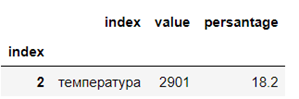

- По всем данным о температуре, добавляемых материалах построены графики частоты или диаграммы размаха для визуальной оценки распределения данных и выявления выбросов, например:
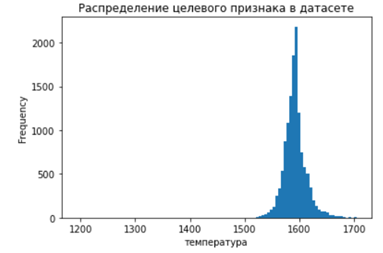
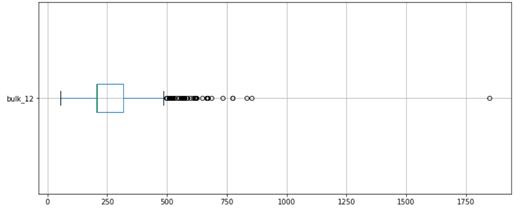

- сделаны выводы во наличии выбросов и ошибок в данных.

В процессе предобработки данных были сделаны следующие шаги:  
- заполнены или удалены пропуски. В материалах пропуски означали добавление нулевого количества компонента, поэтому эти пропуски были заполнены нулями. Пропуски в целевом признаке были удалены исходя из логики процесса обучения  с учителем. Все данные, относящиеся к таким партиям без целевого признака, тоже были уделены.
- были удалены явные ошибки в данных, такие как отрицательная мощность и температура ниже 1500 гр. Все данные, относящиеся к таким партиям с явными ошибками, тоже были уделены.
- сильные выбросы данных были удалены только для обучающего набора данных, чтобы уменьшить влияние выбросов на обучение модели и одновременно смоделировать реальные условия, когда данные уже обученная модель получает с возможными выбросам, т.е. сильно отличающимися от остальных значениями. 
- были созданы новые признаки, такие как: полная мощность, которая вычисляется как корень из квадратов сумм активной и реактивной мощностей; полное время работы электродов для каждой партии, другими словами, время нагрева раствора стали; количество запусков нагревающих электродов; выделена первая измеренная температура (последняя – целевой признак); сумма масс всех проволочных материалов; сумма масс сыпучих материалов.
- все признаки были исследованы на корреляцию с целевым и на мультиколлениарность. Были получены два типа коэффициентов: Пирсона и коэффициенты алгоритма phik. 

Фрагмент графика корреляции целевого признака и остальных признаков (коэффициенты phik )  
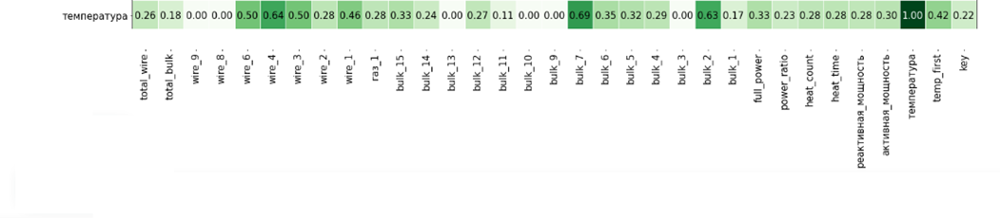

В процессе исследования на мультиколлениарность были найдены признаки, коррелирующие с  друг с другом с коэффициентом большим 0.7. Взят был один из группы таких признаков. Критерий выбора: сила влияния на целевой.  
В результате были отобраны следующие признаки для дальнейшей работы с моделями машинного обучения:  
'power_ratio', 'heat_time', 'temp_first', 'wire_4', 'full_power', 'wire_1', 'wire_3', 'wire_6', 'wire_2', 'газ_1', 'bulk_15', 'bulk_7',  'bulk_1'

- масшабирование признаков. Для линейных моделей, таких как линейная регрессия, небоходимо приводить признаки к одному масштабу. Используя инструмент StandardScaler, размерность признаков была преобразована к диапазону от -1 до 1.

**Обучение моделей и выбор наилучшей.**

Для обучения были использованы следующие модели (приведен показатель метрики на обучающей выборке с использованием кросс-валидациии):  
- Линейная регрессия             (6.18)
- Случайный лес                       (6.21)
- Градиентный бустинг           (6.24)
- LGBMRegressor                       (6.16)
- Метод ближайших соседей(6.65)
- CatBoostRegressor                   (5.99)  
Итоговой моделью выбрана модель CatBoostRegressor. Гиперпараметры модели: depth=4, l2_leaf_reg=3,  learning_rate=0.03. Гиперпараметры моделей подбирались методом GridSearch с использованием кросс-валидации.  
После выбранная модель была протестирована на тестовой выборке. 
В результате получена метрика модели на тестовой выборке - 6.30


**Результаты и интерпретация**

Следующая таблица демонстрирует важность признаков для предсказания целевого. Толщина линии на графике напротив параметра показывает нам, как много элементов присутствует в выборке с данным значением конкретного параметра. Чем краснее точки на графике, тем большее значение имеет фича в ней.
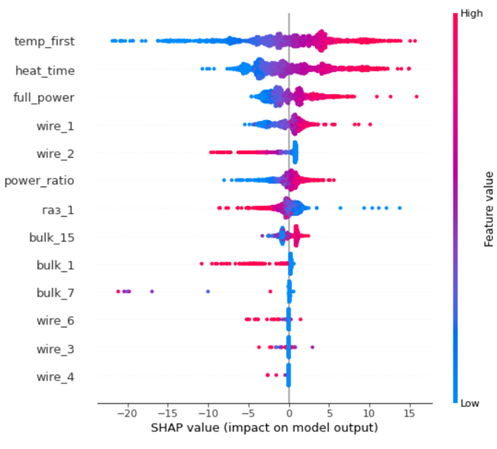  
Исходя из этого, можно сделать вывод:  на предсказание модели сильно влияют первая температура, время нагрева и показатель полной мощности.  Более половины признаков оказывают лишь незначительное влияние на целевой.  
Признаки  bulk_7, wire_4 можно порекомендовать опустить при необходимости оптимизировать скорость работы модели.


**Рекомендации**

 - На этапе создания датасета добавить колонки: полная мощность. В модель рекомендуется загружать сводную таблицу данных по партиям с выделением первой температуры, средней полной мощности, общего времени нагрева и показателям материалов bulk_1, bulk_7, bulk_15, газ_1, wire_1, wire_2, wire_3, wire_4,  wire_6.  
 - Рекомендовано уделить внимание появлению явных ошибок в данных: некорректной температур и мощности. Нужно помнить, что предсказание, полученное на данных с такими ошибками, будет значительно хуже по качеству, чем ожидается.  
 - Также можно заметить, что если в будущем появится необходимость сократить скорость работы модели, то можно использовать более быстрые, например линейную регрессии,  т.к. все модели  продемонстрировали приемлемое качество на обучающей выборке.
